**Step 01:** Import required Libraries and read the dataset

In [1]:
############################################################################################################
########################            Importing Libraries             ########################################
############################################################################################################
import warnings
warnings.filterwarnings("ignore")

# Data loading and plotting libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib import style
style.use('ggplot')

# Import NLP related libraries
import nltk
import re
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from wordcloud import WordCloud

# Import Models etc

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split


**Step 02:** Read the DataSet and Visualize it

In [2]:
DS = pd.read_csv('IMDB Dataset.csv')
print ('No of examples : ', DS.shape[0])
DS.head()

No of examples :  50000


,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


Text(0.5, 1.0, 'Count of Positive and negative Sentiment')

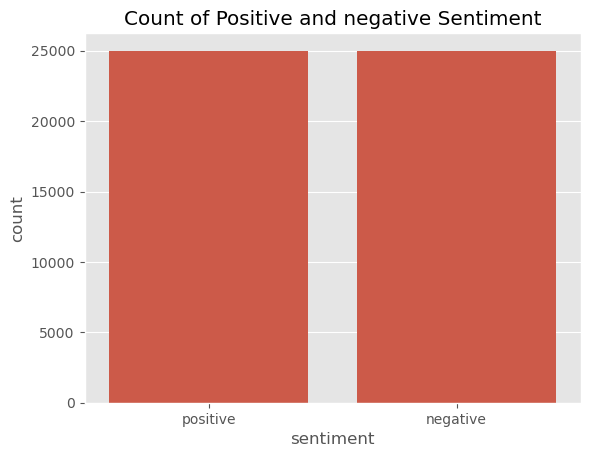

In [3]:
# We have a balance dataset of positive and negative examples
sns.countplot(x= 'sentiment', data = DS)
plt.title("Count of Positive and negative Sentiment")


**Step # 03:** Data Pre Processing \
    (1) Adding word count to the DataFrame\
    (2) Replace sentiments with numerical values \
    (3) Text Cleaning\
    (4) Remove Duplicate reviews\
    (5) Reduce words to their roots\
    (6) Count the new word count and replace it in the DataFrame \
    (7) Applying TFIDF to the data\
    (8) Splitting the data into training and training sets
    
    
    

In [4]:
# (1) Adding word count to the dataframe
def no_of_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

DS['word count'] = DS['review'].apply(no_of_words)
DS.head()

,review,sentiment,word count
0,One of the other reviewers has mentioned that ...,positive,307
1,A wonderful little production. <br /><br />The...,positive,162
2,I thought this was a wonderful way to spend ti...,positive,166
3,Basically there's a family where a little boy ...,negative,138
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,230


In [5]:
#(2) Replace sentiments with numerical values
DS.sentiment.replace("positive", 1, inplace=True)
DS.sentiment.replace("negative", 2, inplace=True)

In [6]:
# (3):  Text Cleaning

def data_processing(text):
# convert text to lowercase
    text= text.lower()
# remove <br /> from text
    text = re.sub('<br />', '', text)
# remove links starting with https, www, and http. remove if it also extends to multiple lines
    text = re.sub(r"https\S+|www\S+|http\S+", '', text, flags = re.MULTILINE)
# remove text with @words and hashtags #
    text = re.sub(r'\@w+|\#', '', text)
# remove non word and non white space characters
    text = re.sub(r'[^\w\s]', '', text)
# split the text into individual words
    text_tokens = word_tokenize(text)
#remove words that carry out little meaning in NLP Tasks
    filtered_text = [w for w in text_tokens if not w in stop_words]
# return the filtered words separated by spaces
    return " ".join(filtered_text)


# apply pre_processing to the data review column
Orig_rev_sample =  DS.iloc[0][0]
DS.review = DS['review'].apply(data_processing)
Proc_rev_sample = DS.iloc[0][0]

print( 'Original review: ', Orig_rev_sample, '\n')
print( 'Processed review: ', Proc_rev_sample)


Original review:  One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show

In [7]:
# (4) Remove duplicate reviews

# show dulicatereviews
duplicated_count = DS.duplicated().sum()
print("Number of duplicate entries: ", duplicated_count)

# drop duplicate reviews
df = DS.drop_duplicates('review')

Number of duplicate entries:  421


In [8]:
# (5) Reduce words to their roots
stemmer = PorterStemmer()
def stemming(data):
    print(data)
    text = [stemmer.stem(word) for word in data]
    return data

# Apply stemming to the data
DS.review = DS['review'].apply(lambda x: stemming(x))

one reviewers mentioned watching 1 oz episode youll hooked right exactly happened methe first thing struck oz brutality unflinching scenes violence set right word go trust show faint hearted timid show pulls punches regards drugs sex violence hardcore classic use wordit called oz nickname given oswald maximum security state penitentary focuses mainly emerald city experimental section prison cells glass fronts face inwards privacy high agenda em city home manyaryans muslims gangstas latinos christians italians irish moreso scuffles death stares dodgy dealings shady agreements never far awayi would say main appeal show due fact goes shows wouldnt dare forget pretty pictures painted mainstream audiences forget charm forget romanceoz doesnt mess around first episode ever saw struck nasty surreal couldnt say ready watched developed taste oz got accustomed high levels graphic violence violence injustice crooked guards wholl sold nickel inmates wholl kill order get away well mannered middle c

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



fata morgana 1971 documentarylike film german filmmaker extraordinaire werner herzog filmed several years late 1960s one rare dvds listened commentary turned visual feast north african mostly saharan imagery timeless simply could tell made thirtyfive years ago soundtrack film including german classical music mozart handel rock music blind faith leonard cohen also lends timeless quality narration three different german narrators german film historian lotte eisner eugen des montagnes wolfgang von ungernsternberg solid herzog goes eisners import project film history english speaker translation james william gledhill voice seems downright deific lends far perfectly project even though much text either language rather superfluous yes faux biblical sounds popul vuh mayan creation myth films first part creation interesting text herzog wrote remaining two parts paradise golden age along quotes german poet herzog names manfred eigendorf almost seems satire first parts somber tone film seems pie

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



could rate zero would coming someone likes shockexploitation films time waters overall must say uselessit nothing serves nothing idiot camera urge prove cleverness rebeling social standards comes asits entirely amateur principle execution doesnt point digusting sake disgusting obscene wit neanderthal uselesssomeone said waters probably chuckling bad press disgust others gave film made short film depicting man bathroom taking sht ten minutes straight surely would receive accomidations would proud chuckle would unintelligent resort say ha take censors mainstream im rebellious ill whatever want film nowaters shouldnt proud mess fans waters shouldnt watch useless without useits doesnt even fit criteria art arts saketo like defend movie defend something designed purposely anticulture pushed mainstream audience modern terms film hot topic filmsuseless obsolete poser film demands acknowledged rebellion
said deanna durbin invented teenagery first film one best humorous story presented delightf

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



film reminds college students used protest vietnam war upon hearing kids without cheeseburgers cow dung collehe president going immediately change us foreign policythe worst thing dangerous concept policy based ussr us went war could mean end world worked us ussr never went warhad conventional weapons notion yet another war winable war europe asia unthinkablenot think get rid movie seen film students splendid example make filmit 0 stars maybe black holes
scientist working frantically seclusion finds way locate impact crater meteor carrying new radioactive element pseudoscience breakthrough technology talks 1930s right including idea radioactivity could heal illness properly harnessed summons rivals cast scientific community ridiculed witness discovery propose joint expedition africaof course end stealing much dr rukhs original discovery giving residual credit addition effeminate weakling looks like supporting comedy actor worst abbotcostello lawton literally steals dr rukhs young troph

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



knew would bad movie rented hoped good bad movie oh well fun making fun endless sand trudging eating camel dung well actually eggplant weird grimacing acting think five actors dvd needs directors commentary find thinkingor cant believe actually went england austrialia wherever film thiscould done anywhere would better managed get naked best line movie waiting upgrades yup still waiting funny anyone 3 pages dialog beyond narratorshut already ill watch
madonna gets action fails whos girl released one year huge flop shangai surprise two successful cult movie desperately seeking susan chose act forget flop previous movie suspecting latter could flop movie received bad acceptance american critic audience europe success madonna states people dont want shes successful pop star moviestar soundtrack album sings four tracks sells well titletrack single agreat hit world like world tour truth isthat madonna failed actress cause script quite weak butits bad especially like 80s ramshackle trash colo

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [9]:
#(6) Count the number of words and replace in the dataframe
DS['word count'] = DS['review'].apply(no_of_words)
DS.head()

,review,sentiment,word count
0,one reviewers mentioned watching 1 oz episode ...,1,168
1,wonderful little production filming technique ...,1,84
2,thought wonderful way spend time hot summer we...,1,86
3,basically theres family little boy jake thinks...,2,67
4,petter matteis love time money visually stunni...,1,125


In [10]:
# (7): Applying TFIDF to the data
X = DS['review']
Y = DS['sentiment']
vect = TfidfVectorizer()
X = vect.fit_transform(DS['review'])

In [11]:
# (8) Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
print("Size of x_train: ", (x_train.shape))
print("Size of y_train: ", (y_train.shape))
print("Size of x_test: ", (x_test.shape))
print("Size of y_test: ", (y_test.shape))

Size of x_train:  (35000, 221707)
Size of y_train:  (35000,)
Size of x_test:  (15000, 221707)
Size of y_test:  (15000,)


**Step 03 :** Training and Testing the model


In [12]:
# Training and Testing 
logreg = LogisticRegression()
logreg.fit(x_train, y_train)
logreg_pred = logreg.predict(x_test)
logreg_acc = accuracy_score(logreg_pred, y_test)
print("Test accuracy: {:.2f}%".format(logreg_acc*100))

Test accuracy: 89.57%


In [13]:
print(confusion_matrix(y_test, logreg_pred))
print("\n")
print(classification_report(y_test, logreg_pred))

[[6872  717]
 [ 848 6563]]


              precision    recall  f1-score   support

           1       0.89      0.91      0.90      7589
           2       0.90      0.89      0.89      7411

    accuracy                           0.90     15000
   macro avg       0.90      0.90      0.90     15000
weighted avg       0.90      0.90      0.90     15000



In [24]:
x = str(input())
#x  = x.np.reshape([1,-1])
x= stemming([x])
X = vect.transform(x)
#X = X.reshape([-1,1])
y = logreg.predict(X)
print("\n")
if y==1:
    print ( "positive review" )
else:
    print("Negative Review")

#logreg.predict(' this is not a good product')

 the movie was really good at all bads


['the movie was really good at all bads']


positive review


In [15]:
y


array([1])